### Imports

In [1]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
from scipy.io import loadmat
import statsmodels.api as sm
import pandas as pd
from itertools import cycle
import itertools
from pandas.core.common import flatten
from plotly.subplots import make_subplots
import plotly.figure_factory as ff


## Figure 5

    0.9470
    0.9646

    0.9470    0.9645
    0.9646    0.9646

------------
RRIFT with measured AIF-tail.
CCC and Pearson correlation coefficient for Ktrans, ve, and vp
    0.9470    0.9645    0.7262
    0.9646    0.9646    0.7594

RRIFT with assumed AIF-tail.
CCC and Pearson correlation coefficient for Ktrans, ve, and vp
    0.8855    0.9337    0.7771
    0.9493    0.9480    0.7902

RRM with assumed muscle parameters.
CCC and Pearson correlation coefficient for Ktrans, ve, and vp
    0.8555    0.8175    0.5096
    0.9090    0.9487    0.6879


vars =

  1x6 cell array

    {'RRIFT_measured_AIF...'}    {'overlay_measured_A...'}    {'RRIFT_assumed_AIF_...'}    {'overlay_assumed_AI...'}    {'RRM_assumed_Ktrans_RR'}    {'overlay_assumed_Kt...'}



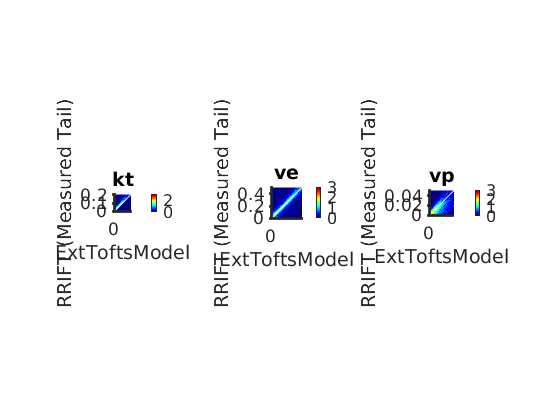

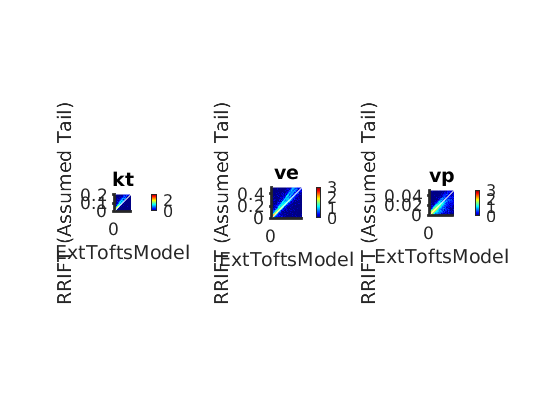

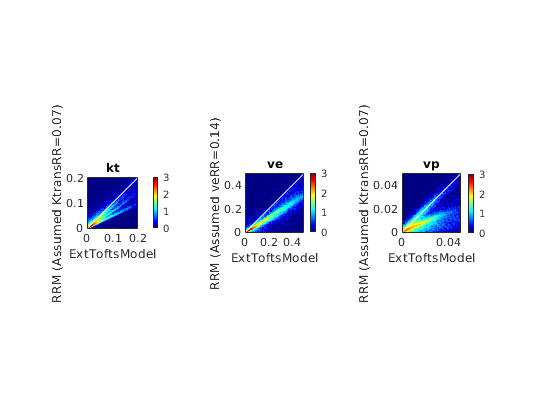

In [2]:
%% Initialize
clearvars
fclose('all');
addpath('RRIFT/mfiles')

%% Configuration

inDir = 'RRIFT/data/TCGA-GBM-Results/c02_postprocessed'; % Input directory (output from c02_doRRIFT.m)

%% Main

matFiles = dir([inDir '/*.mat']);

% Initialize arrays (the variable names will be cleaned up later)
[
    arrKtETM, arrKepETM, arrVeETM, arrVpETM,... % Tumour parameters from ETM
    arrKtRRIFT, arrKepRRIFT, arrVeRRIFT, arrVpRRIFT,... % Tumour parameters from RRIFT-measuredTail
    arrKtRRIFTPop, arrVeRRIFTPop, arrVpRRIFTPop,... % Tumour parameters from RRIFT-assumedTail
    arrKtRRM, arrVeRRM, arrVpRRM,... % Tumour parameters from reference region model (i.e. relative parameters)
    crrList, cpList, tList... % Reference tissue & AIF curve for each patient
] = deal([]); % This will waste some RAM, but it makes the code simpler
% Pre-allocate more arrays
[
    arrKtETM_m, arrKepETM_m, arrVeETM_m, arrVpETM_m,... % Muscle parameters from ETM
    arrKepRRIFT_m, arrVeRRIFT_m, arrKtRRIFT_m,... % Muscle parameters from RRIFT-measuredTail
    arrKtRRIFTPop_m, arrVeRRIFTPop_m,... % Muscle parameters from RRIFT-assumedTail
    arrKtRRIFTD_m, arrVeRRIFTD_m,... % Muscle parameters from differential form of RRIFT
    cccKt, cccKep, cccVe, cccVp,...  % Concordance correlation coefficient for each study
    t1CpList, t1CrrList, t1CtList,... % T1 for the AIF, muscle, and tumour
    nVoxGood, nVox, nVoxRR, snrList, cnrList, sigmaList,... % miscellanea
    arrKtRRci, arrKepRRci, arrVeRRci, arrKtRRTci, arrKepRRTci, arrVeRRTci... % uncertainty of muscle estimates
] = deal(zeros(length(matFiles),1));

for i=1:length(matFiles)
    curFile = matFiles(i).name;
    
    load(fullfile(inDir,curFile));
    % Loads (refer to b02_doRRIFT.m):
        % mapKt, mapKep, mapVe, mapVp, ...
        % mapKtR, mapKepR, mapVeR, mapVpR, ...
        % Crr, Cp, t, maskCt, maskCrr, ETM, estKepRR, ...
        % estKtRR, estVeRR, estKtRRPop, estVeRRPop, estKtRRdiff, estVeRRdiff, ...
        % Rsq, RsqPop, num, denum, numVox, numGoodVox, ...
        % cnr, snr, sigmaCt, T1Cp, T1Crr, T1Ct, ...
        % ciKtRR, ciKepRR, ciVeRR, ciKtRRT, ciKepRRT, ciVeRRT
    %% Concatenate all the fitted parameters for tumour
    % From extended Tofts model
    arrKtETM = [arrKtETM; mapKt(maskCt)];
    arrKepETM = [arrKepETM; mapKep(maskCt)];
    arrVeETM = [arrVeETM; mapVe(maskCt)];
    arrVpETM = [arrVpETM; mapVp(maskCt)];
    % From Reference Region Model + RRIFT
    arrKtRRIFT = [arrKtRRIFT; mapKtR(maskCt)];
    arrKepRRIFT = [arrKepRRIFT; mapKepR(maskCt)];
    arrVeRRIFT = [arrVeRRIFT; mapVeR(maskCt)];
    arrVpRRIFT = [arrVpRRIFT; mapVpR(maskCt)];
    % From Reference Region Model + RRIFT with PopAvg AIF
    arrKtRRIFTPop = [arrKtRRIFTPop; mapKtR(maskCt).*estKtRRPop./estKtRR];
    arrVeRRIFTPop = [arrVeRRIFTPop; mapVeR(maskCt).*estVeRRPop./estVeRR];
    arrVpRRIFTPop = [arrVpRRIFTPop; mapVpR(maskCt).*estKtRRPop./estKtRR];
    % From Reference Region Model (without RRIFT)
    arrKtRRM = [arrKtRRM; mapKtR(maskCt)./estKtRR];
    arrVeRRM = [arrVeRRM; mapVeR(maskCt)./estVeRR];
    arrVpRRM = [arrVpRRM; mapVpR(maskCt)./estKtRR];
%     % ^ These maps were multipled by estKtRR and estVeRR in a04_doRRIFT, so
%     % we have to undo the scaling to get the original fits without RRIFT
    %% Collect the curves for input function & muscle
    crrList = [crrList Crr];
    cpList = [cpList Cp];
    tList = [tList t];
    %% Compute the Concordance Correlation Coefficient for each dataset
    % This is the CCC for the tumour fits
    cccKt(i) = CCC(mapKt(maskCt),mapKtR(maskCt));
    cccKep(i) = CCC(mapKep(maskCt),mapKepR(maskCt));
    cccVe(i) = CCC(mapVe(maskCt),mapVeR(maskCt));
    cccVp(i) = CCC(mapVp(maskCt),mapVpR(maskCt));
    %% Concatenate the estimates for muscle (from RRIFT or Tofts model)
    % From Extended Tofts model
    arrKtETM_m(i) = ETM.muscle(1);
    arrKepETM_m(i) = ETM.muscle(2);
    arrVeETM_m(i) = ETM.muscle(1)./ETM.muscle(2);
    arrVpETM_m(i) = ETM.muscle(3);
    % From RRIFT
    arrKtRRIFT_m(i) = estKtRR;
    arrKepRRIFT_m(i) = estKepRR;
    arrVeRRIFT_m(i) = estVeRR;
    
    % From RRIFT
    arrKtRRIFTPop_m(i) = estKtRRPop;
    arrVeRRIFTPop_m(i) = estVeRRPop;
    
    % Confidence Intervals
    arrKtRRci(i) = ciKtRR;
    arrKepRRci(i) = ciKepRR;
    arrVeRRci(i) = ciVeRR;
    arrKtRRTci(i) = ciKtRRT;
    arrKepRRTci(i) = ciKepRRT;
    arrVeRRTci(i) = ciVeRRT;
    
    % From Differential versione of RRIFT
    arrKtRRIFTD_m(i) = estKtRRdiff;
    arrVeRRIFTD_m(i) = estVeRRdiff;
    % kepRRD and kepRRIFT will be the same, since kepRR is estimate by
    % reference region model and not by RRIFT
    %% Collect additional statistics
    nVoxGood(i) = numGoodVox;
    nVox(i) = numVox;
    nVoxRR(i) = sum(maskCrr(:)>0); % Number of voxels in muscle contour
    snrList(i) = snr;
    cnrList(i) = cnr;
    sigmaList(i) = sigmaCt;
    t1CpList(i) = T1Cp;
    t1CrrList(i) = T1Crr;
    t1CtList(i) = T1Ct;
end
%% Cleanup - Part 1: Re-organize some results into a structure for clarity

[tumour, muscle] = deal(struct());

% ETM parameters for tumour
tumour.Kt.ETM = arrKtETM;
tumour.Kep.ETM = arrKepETM;
tumour.Ve.ETM = arrVeETM;
tumour.Vp.ETM = arrVpETM;

% RRIFT parameters for tumour
tumour.Kt.RRIFT = arrKtRRIFT;
tumour.Kep.RRIFT = arrKepRRIFT;
tumour.Ve.RRIFT = arrVeRRIFT;
tumour.Vp.RRIFT = arrVpRRIFT;

% RRIFT (assumed tail) parameters for tumour
tumour.Kt.RRIFT_Pop = arrKtRRIFTPop;
tumour.Kep.RRIFT_Pop = arrKepRRIFT; % kep is unaffected by tail choice
tumour.Ve.RRIFT_Pop = arrVeRRIFTPop;
tumour.Vp.RRIFT_Pop = arrVpRRIFTPop;

% Relative parameters from RRM
tumour.Kt.RRM = arrKtRRM;
tumour.Kep.RRM = arrKepRRIFT; % kep is unaffected by RRIFT
tumour.Ve.RRM = arrVeRRM;
tumour.Vp.RRM = arrVpRRM;

% ETM parameters for muscle
muscle.Kt.ETM = arrKtETM_m;
muscle.Kep.ETM = arrKepETM_m;
muscle.Ve.ETM = arrVeETM_m;

% RRIFT parameters for muscle
muscle.Kt.RRIFT = arrKtRRIFT_m;
muscle.Kep.RRIFT = arrKepRRIFT_m;
muscle.Ve.RRIFT = arrVeRRIFT_m;

% RRIFT (assumed tail) parameters for muscle
muscle.Kt.RRIFT_Pop = arrKtRRIFTPop_m;
muscle.Kep.RRIFT_Pop = arrKepRRIFT_m;
muscle.Ve.RRIFT_Pop = arrVeRRIFTPop_m;


%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%% FIGURE 5 RRIFT with measured AIF-tail %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

%% [Figs. 5 & S2] 2D Histograms - RRIFT vs Tofts Model
overlayInfo = [];

doLog = 0;


figure('Position',[100,300,1800,400]);

% 2D hist kt

valsA = tumour.Kt.ETM;
valsB = tumour.Kt.RRIFT;

valsA(valsA<0) = NaN;
valsB(valsB<0) = NaN;

if doLog
    valsA = log10(valsA);
    valsB = log10(valsB);
    valsA(valsA < -5) = NaN;
    valsB(valsB < -5) = NaN;
else
    valsA(valsA > 0.2) = NaN;
    valsB(valsB > 0.2) = NaN;
end

subplot(1,3,1)
h1=histogram2(valsA,valsB,100,'DisplayStyle','tile','ShowEmptyBins','on');
[a1,a2] = CCC(valsA,valsB);
overlayInfo(1,1) = a1;
overlayInfo(2,1) = a2;
sum(isfinite(h1.Data(:)))/2./length(h1.Data);
overlay_measured_AIF_tail = overlayInfo;
h1_x_bin_edges = h1.XBinEdges;
h1_y_bin_edges = h1.YBinEdges;
RRIFT_measured_AIF_tail = imgaussfilt(log10(h1.Values'+1),0.5);
imagesc(h1.XBinEdges,h1.YBinEdges,imgaussfilt(log10(h1.Values'+1),0.5))
set(gca,'YDir','normal')
colormap('jet')
caxis([0 3])
hold on;
plot([min(valsA) max(valsA)],[min(valsA) max(valsA)],'w')
xlabel('ExtToftsModel')
ylabel('RRIFT (Measured Tail)')
title('kt')
colorbar
pbaspect([1 1 1])
%set(gca,'YTick',0:0.05:0.2)
customizeFig(gca);
disp(overlayInfo)
%disp(valsB_part1)

% 2D hist ve
valsA = tumour.Ve.ETM;
valsB = tumour.Ve.RRIFT;

valsA(valsA<0) = NaN;
valsB(valsB<0) = NaN;

if doLog
    valsA = log10(valsA);
    valsB = log10(valsB);
    valsA(valsA < -5) = NaN;
    valsB(valsB < -5) = NaN;
else
    valsA(valsA > 0.5) = NaN;
    valsB(valsB > 0.5) = NaN;
end

subplot(1,3,2)
h=histogram2(valsA,valsB,100,'DisplayStyle','tile','ShowEmptyBins','on');
imagesc(h.XBinEdges,h.YBinEdges,imgaussfilt(log10(h.Values'+1),0.5))
[a1,a2] = CCC(valsA,valsB);
overlayInfo(1,2) = a1;
overlayInfo(2,2) = a2;
set(gca,'YDir','normal')
colormap('jet')
caxis([0 3])
hold on;
plot([min(valsA) max(valsA)],[min(valsA) max(valsA)],'w')
xlabel('ExtToftsModel')
ylabel('RRIFT (Measured Tail)')
title('ve')
colorbar
pbaspect([1 1 1])
%set(gca,'YTick',0:0.1:0.5)
customizeFig(gca);
disp(overlayInfo)

% 2D hist vp

valsA = tumour.Vp.ETM;
valsB = tumour.Vp.RRIFT;

valsA(valsA<0) = NaN;
valsB(valsB<0) = NaN;

if doLog
    valsA = log10(valsA);
    valsB = log10(valsB);
    valsA(valsA < -5) = NaN;
    valsB(valsB < -5) = NaN;
else
    valsA(valsA > 0.05) = NaN;
    valsB(valsB > 0.05) = NaN;
end

subplot(1,3,3)
h=histogram2(valsA,valsB,100,'DisplayStyle','tile','ShowEmptyBins','on');
[a1,a2] = CCC(valsA,valsB);
overlayInfo(1,3) = a1;
overlayInfo(2,3) = a2;
sum(isfinite(h.Data(:)))/2./length(h.Data);
imagesc(h.XBinEdges,h.YBinEdges,imgaussfilt(log10(h.Values'+1),0.5))
set(gca,'YDir','normal')
colormap('jet')
caxis([0 3])
hold on;
plot([min(valsA) max(valsA)],[min(valsA) max(valsA)],'w')
xlabel('ExtToftsModel')
ylabel('RRIFT (Measured Tail)')
title('vp')
colorbar
pbaspect([1 1 1])
%set(gca,'YTick',0:0.01:0.05)
customizeFig(gca);

disp('------------')
disp('RRIFT with measured AIF-tail.') 
disp('CCC and Pearson correlation coefficient for Ktrans, ve, and vp')
disp(overlayInfo)
disp('')
%% [Figs. 5 & S2] 2D Histogram - RRIFT w/ PopAvg AIF vs Tofts Model
overlayInfo = [];

doLog = 0;


%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%% FIGURE 5 RRIFT with assumed AIF-tail %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


figure('Position',[100,300,1800,400]);

% 2D hist kt

valsA = tumour.Kt.ETM;
valsB = tumour.Kt.RRIFT_Pop;

valsA(valsA<0) = NaN;
valsB(valsB<0) = NaN;

if doLog
    valsA = log10(valsA);
    valsB = log10(valsB);
    valsA(valsA < -5) = NaN;
    valsB(valsB < -5) = NaN;
else
    valsA(valsA > 0.2) = NaN;
    valsB(valsB > 0.2) = NaN;
end

subplot(1,3,1)
h=histogram2(valsA,valsB,100,'DisplayStyle','tile','ShowEmptyBins','on');
[a1,a2] = CCC(valsA,valsB);
overlayInfo(1,1) = a1;
overlayInfo(2,1) = a2;
sum(isfinite(h.Data(:)))/2./length(h.Data);
RRIFT_assumed_AIF_tail = imgaussfilt(log10(h.Values'+1),0.5);
overlay_assumed_AIF_tail = overlayInfo;
imagesc(h.XBinEdges,h.YBinEdges,imgaussfilt(log10(h.Values'+1),0.5))
set(gca,'YDir','normal')
colormap('jet')
caxis([0 3])
hold on;
plot([min(valsA) max(valsA)],[min(valsA) max(valsA)],'w')
xlabel('ExtToftsModel')
ylabel('RRIFT (Assumed Tail)')
title('kt')
colorbar
pbaspect([1 1 1])
%set(gca,'YTick',0:0.05:0.2)
customizeFig(gca);

% 2D hist ve
valsA = tumour.Ve.ETM;
valsB = tumour.Ve.RRIFT_Pop;

valsA(valsA<0) = NaN;
valsB(valsB<0) = NaN;

if doLog
    valsA = log10(valsA);
    valsB = log10(valsB);
    valsA(valsA < -5) = NaN;
    valsB(valsB < -5) = NaN;
else
    valsA(valsA > 0.5) = NaN;
    valsB(valsB > 0.5) = NaN;
end

subplot(1,3,2)
h=histogram2(valsA,valsB,100,'DisplayStyle','tile','ShowEmptyBins','on');
imagesc(h.XBinEdges,h.YBinEdges,imgaussfilt(log10(h.Values'+1),0.5))
[a1,a2] = CCC(valsA,valsB);
overlayInfo(1,2) = a1;
overlayInfo(2,2) = a2;
set(gca,'YDir','normal')
colormap('jet')
caxis([0 3])
hold on;
plot([min(valsA) max(valsA)],[min(valsA) max(valsA)],'w')
xlabel('ExtToftsModel')
ylabel('RRIFT (Assumed Tail)')
title('ve')
colorbar
pbaspect([1 1 1])
%set(gca,'YTick',0:0.1:0.5)
customizeFig(gca);

% 2D hist vp

valsA = tumour.Vp.ETM;
valsB = tumour.Vp.RRIFT_Pop;

valsA(valsA<0) = NaN;
valsB(valsB<0) = NaN;

if doLog
    valsA = log10(valsA);
    valsB = log10(valsB);
    valsA(valsA < -5) = NaN;
    valsB(valsB < -5) = NaN;
else
    valsA(valsA > 0.05) = NaN;
    valsB(valsB > 0.05) = NaN;
end

subplot(1,3,3)
h=histogram2(valsA,valsB,100,'DisplayStyle','tile','ShowEmptyBins','on');
[a1,a2] = CCC(valsA,valsB);
overlayInfo(1,3) = a1;
overlayInfo(2,3) = a2;
sum(isfinite(h.Data(:)))/2./length(h.Data);
imagesc(h.XBinEdges,h.YBinEdges,imgaussfilt(log10(h.Values'+1),0.5))
set(gca,'YDir','normal')
colormap('jet')
caxis([0 3])
hold on;
plot([min(valsA) max(valsA)],[min(valsA) max(valsA)],'w')
xlabel('ExtToftsModel')
ylabel('RRIFT (Assumed Tail)')
title('vp')
colorbar
pbaspect([1 1 1])
%set(gca,'YTick',0:0.01:0.05)
customizeFig(gca);

disp('RRIFT with assumed AIF-tail.') 
disp('CCC and Pearson correlation coefficient for Ktrans, ve, and vp')
disp(overlayInfo)
disp('')

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%% FIGURE 5 RRM with assumed Ktrans %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

%% Histogram - assumed values of 0.07/0.14 (same as simulation)
overlayInfo = [];
doLog = 0;

assumedKtRR = 0.07;
assumedVeRR = 0.14;

figure('Position',[100,300,1800,400]);

% 2D hist kt

valsA = tumour.Kt.ETM;
valsB = tumour.Kt.RRM*0.07;

valsA(valsA<0) = NaN;
valsB(valsB<0) = NaN;

if doLog
    valsA = log10(valsA);
    valsB = log10(valsB);
    valsA(valsA < -5) = NaN;
    valsB(valsB < -5) = NaN;
else
    valsA(valsA > 0.2) = NaN;
    valsB(valsB > 0.2) = NaN;
end

subplot(1,3,1)
h=histogram2(valsA,valsB,100,'DisplayStyle','tile','ShowEmptyBins','on');
[a1,a2] = CCC(valsA,valsB);
overlayInfo(1,1) = a1;
overlayInfo(2,1) = a2;
sum(isfinite(h.Data(:)))/2./length(h.Data);
RRM_assumed_Ktrans_RR = imgaussfilt(log10(h.Values'+1),0.5);
overlay_assumed_Ktrans_RR = overlayInfo;
imagesc(h.XBinEdges,h.YBinEdges,imgaussfilt(log10(h.Values'+1),0.5))
set(gca,'YDir','normal')
colormap('jet')
caxis([0 3])
hold on;
plot([min(valsA) max(valsA)],[min(valsB) max(valsB)],'w')
xlabel('ExtToftsModel')
ylabel('RRM (Assumed KtransRR=0.07)')
title('kt')
colorbar
pbaspect([1 1 1])
%set(gca,'YTick',0:0.05:0.2)

% 2D hist ve
valsA = tumour.Ve.ETM;
valsB = tumour.Ve.RRM*0.14;

valsA(valsA<0) = NaN;
valsB(valsB<0) = NaN;

if doLog
    valsA = log10(valsA);
    valsB = log10(valsB);
    valsA(valsA < -5) = NaN;
    valsB(valsB < -5) = NaN;
else
    valsA(valsA > 0.5) = NaN;
    valsB(valsB > 0.5) = NaN;
end

subplot(1,3,2)
h=histogram2(valsA,valsB,100,'DisplayStyle','tile','ShowEmptyBins','on');
imagesc(h.XBinEdges,h.YBinEdges,imgaussfilt(log10(h.Values'+1),0.5))
[a1,a2] = CCC(valsA,valsB);
overlayInfo(1,2) = a1;
overlayInfo(2,2) = a2;
set(gca,'YDir','normal')
colormap('jet')
caxis([0 3])
hold on;
plot([min(valsA) max(valsA)],[min(valsA) max(valsA)],'w')
xlabel('ExtToftsModel')
ylabel('RRM (Assumed veRR=0.14)')
title('ve')
colorbar
pbaspect([1 1 1])
%set(gca,'YTick',0:0.1:0.5)

% 2D hist vp

valsA = tumour.Vp.ETM;
valsB = tumour.Vp.RRM*0.07;

valsA(valsA<0) = NaN;
valsB(valsB<0) = NaN;

if doLog
    valsA = log10(valsA);
    valsB = log10(valsB);
    valsA(valsA < -5) = NaN;
    valsB(valsB < -5) = NaN;
else
    valsA(valsA > 0.05) = NaN;
    valsB(valsB > 0.05) = NaN;
end

subplot(1,3,3)
h=histogram2(valsA,valsB,100,'DisplayStyle','tile','ShowEmptyBins','on');
[a1,a2] = CCC(valsA,valsB);
overlayInfo(1,3) = a1;
overlayInfo(2,3) = a2;
sum(isfinite(h.Data(:)))/2./length(h.Data);
imagesc(h.XBinEdges,h.YBinEdges,imgaussfilt(log10(h.Values'+1),0.5))
set(gca,'YDir','normal')
colormap('jet')
caxis([0 3])
hold on;
plot([min(valsA) max(valsA)],[min(valsA) max(valsA)],'w')
xlabel('ExtToftsModel')
ylabel('RRM (Assumed KtransRR=0.07)')
title('vp')
colorbar
pbaspect([1 1 1])
%set(gca,'YTick',0:0.01:0.05)

disp('RRM with assumed muscle parameters.') 
disp('CCC and Pearson correlation coefficient for Ktrans, ve, and vp')
disp(overlayInfo)
disp('')

# vars = {'RRIFT_measured_AIF_tail', 'overlay_measured_AIF_tail', 'RRIFT_assumed_AIF_tail', 
# 'overlay_assumed_AIF_tail', 'RRM_assumed_Ktrans_RR', 'overlay_assumed_Ktrans_RR'}

# save('fig5vars.mat', vars{:})


In [3]:
%get RRIFT_measured_AIF_tail --from MATLAB
%get overlay_measured_AIF_tail --from MATLAB
%get RRIFT_assumed_AIF_tail --from MATLAB
%get overlay_assumed_AIF_tail --from MATLAB
%get RRM_assumed_Ktrans_RR --from MATLAB
%get overlay_assumed_Ktrans_RR --from MATLAB

print(overlay_assumed_Ktrans_RR)

print('====================================================================================================================')


file = loadmat('fig5vars.mat')

RRIFT_measured_AIF_tail = file['RRIFT_measured_AIF_tail']
overlay_measured_AIF_tail = np.squeeze(np.asarray((np.reshape(file['overlay_measured_AIF_tail'], 2))))
RRIFT_assumed_AIF_tail = file['RRIFT_assumed_AIF_tail']
overlay_assumed_AIF_tail = np.squeeze(np.asarray((np.reshape(file['overlay_assumed_AIF_tail'], 2))))
RRM_assumed_Ktrans_RR = file['RRM_assumed_Ktrans_RR']
overlay_assumed_Ktrans_RR = np.squeeze(np.asarray((np.reshape(file['overlay_assumed_Ktrans_RR'], 2))))

print(overlay_assumed_Ktrans_RR)
# print(np.squeeze(np.asarray((np.reshape(overlay_measured_AIF_tail, 2)))))

[0.85545951 0.90903203]
[0.85545951 0.90903203]


In [50]:
file = loadmat('fig5vars.mat')

RRIFT_measured_AIF_tail = file['RRIFT_measured_AIF_tail']
overlay_measured_AIF_tail = np.squeeze(np.asarray((np.reshape(file['overlay_measured_AIF_tail'], 2))))
RRIFT_assumed_AIF_tail = file['RRIFT_assumed_AIF_tail']
overlay_assumed_AIF_tail = np.squeeze(np.asarray((np.reshape(file['overlay_assumed_AIF_tail'], 2))))
RRM_assumed_Ktrans_RR = file['RRM_assumed_Ktrans_RR']
overlay_assumed_Ktrans_RR = np.squeeze(np.asarray((np.reshape(file['overlay_assumed_Ktrans_RR'], 2))))

# RRIFT assumed Ktrans RR
fig = go.Figure()
fig.add_trace(go.Heatmap(z=RRM_assumed_Ktrans_RR,
                          colorscale='jet',
                          zmin=0, zmax=3,
                          hovertemplate="<br>".join(["z: %{z}<extra></extra>",])
                         ))
fig.add_shape(type="line",
    x0=0, y0=0, x1=100, y1=100,
    line=dict(
        color="white",
        width=2,
        dash="dot",
    )          
)

fig.add_annotation(text="CCC: {:.4f} \n ρ: {:.4f}".format(overlay_assumed_Ktrans_RR[0], overlay_assumed_Ktrans_RR[1]),
                    xref="paper", yref="paper",
                    x=0.05, y=0.9, showarrow=False, 
                    font = dict(size = 14, color="#fff"))
                 

# RRIFT with assumed AIF tail
fig.add_trace(go.Heatmap(z=RRIFT_assumed_AIF_tail, colorscale='jet', zmin=0, zmax=3,
                         hovertemplate="<br>".join(["z: %{z}<extra></extra>"]), visible=False))


fig.add_annotation(text="CCC: {:.4f} \n ρ: {:.4f}".format(overlay_assumed_AIF_tail[0], 
                                                           overlay_assumed_AIF_tail[1]),
                    xref="paper", yref="paper",
                    x=0.05, y=0.9, showarrow=False, 
                    font = dict(size = 14, color="#fff"), visible=False)



#RRIFT measured AIF tail
fig.add_trace(go.Heatmap(z=RRIFT_measured_AIF_tail, zmin=0, zmax=3, colorscale='jet', 
                         hovertemplate="<br>".join(["z: %{z}<extra></extra>"]), visible=False))
fig.add_shape(type="line",
    x0=0, y0=0, x1=100, y1=100,
    line=dict(
        color="white",
        width=2,
        dash="dot",
    ), visible=False
)


fig.update_layout(title=r'$\text{RRM with assumed }K^{trans}_{RR}$',
                   xaxis_title=r'$ETM - K^{trans} [min^{-1}]$',
                   yaxis_title=r'$K^{trans}\space[min^{-1}]$',
                   xaxis_tickmode = "array", 
                   xaxis_tickvals = [0, 25, 50, 75, 100], 
                   xaxis_ticktext = ['0', '0.05', '0.10', '0.15', '0.20'],
                   yaxis_tickmode = "array", 
                   yaxis_tickvals = [0, 25, 50, 75, 100], 
                   yaxis_ticktext = ['0', '0.05', '0.10', '0.15', '0.20'],
                   plot_bgcolor="#fff",
                   width=700, height=700,
)

fig.update_traces(
    colorbar_tickmode="array",
    colorbar_tickvals = [0, 1, 2, 3],
    colorbar_ticktext = ['<b>0</b>', '<b>10<sup>1</sup></b>', '<b>10<sup>2</sup></b>', '<b>10<sup>3</sup></b>']
)

fig.update_layout(
    updatemenus=[go.layout.Updatemenu(
        active=0,
        x=0.3,
        y=1.3,
        xanchor="left",
        yanchor="top",
        direction="down",
        type='dropdown',
        buttons=list(
            [
            dict(label = 'RRM with assumed KtransRR',
                  method = 'update',
                  args = [{'visible': [True, False, False]},
                          {'title': r'$\text{RRM with assumed }K^{trans}_{RR}$',
                           'showlegend':True, 'visible': True}]),
             dict(label = 'RRIFT with assumed AIF tail',
                  method = 'update',
                  args = [{'visible': [False, True, False]},
                          {'title': 'RRIFT with assumed AIF tail',
                           'showlegend':True, 'visible': True}]),
             dict(label = 'RRIFT with measured AIF tail',
                  method = 'update',
                  args = [{'visible': [False, False, True]},
                          {'title': 'RRIFT with measured AIF tail',
                           'showlegend':True, 'visible': True},
                          {'annotations': {
                              'text': 'CCC: {:.4f} \n ρ: {:.4f}'.format(overlay_measured_AIF_tail[0], 
                                                           overlay_measured_AIF_tail[1]),
                              'xref': 'paper', 
                              'yref': 'paper',
                              'x': 0.05, 'y': 0.9,
                              'showarrow': False, 
                              'font':{'size': 14, 'color': 'fff'}, 'visible': True}}]
                )
            ]
            )
        )
    ])

fig.show()

## Figure 6


ans =

     0

     1

     2

     3



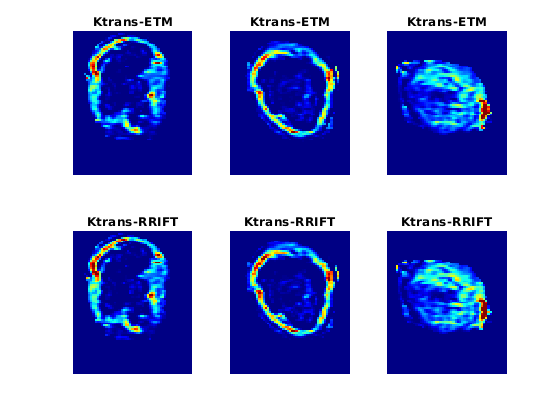

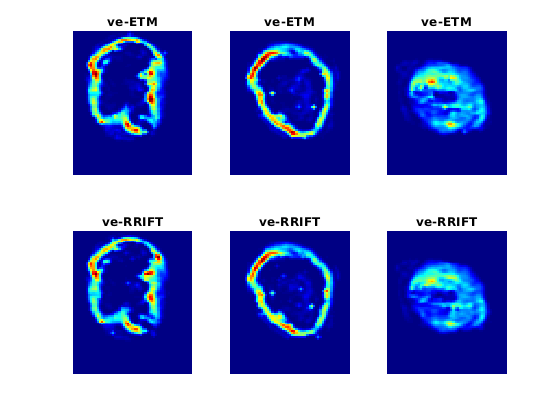

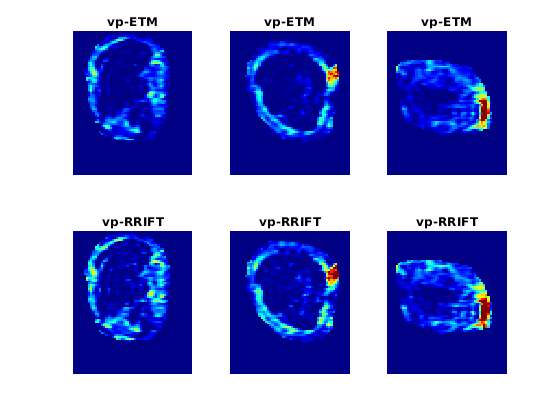

In [12]:
clearvars
fclose('all')
addpath('RRIFT/mfiles')
tic
inDir = 'RRIFT/data/TCGA-GBM-Results/c02_postprocessed';
matFiles = dir([inDir '/*.mat']);

idx = 7; % Chosen Patient (choices are between 1:9)
curFile = matFiles(idx).name;

load(fullfile(inDir,curFile));

% Remove unphysical values from ve and vp  
mapVe(mapVe>1)=NaN;
mapVe(mapVe<0)=NaN;
mapVeR(mapVeR>1)=NaN;
mapVeR(mapVeR<0)=NaN;

mapVp(mapVp>1)=NaN;
mapVp(mapVp<0)=NaN;
mapVpR(mapVpR>1)=NaN;
mapVpR(mapVpR<0)=NaN;

%% Crop the image

mapKt = AutoCrop(mapKt);
mapKep = AutoCrop(mapKep);
mapVe = AutoCrop(mapVe);
mapVp = AutoCrop(mapVp);

mapKtR = AutoCrop(mapKtR);
mapKepR = AutoCrop(mapKepR);
mapVeR = AutoCrop(mapVeR);
mapVpR = AutoCrop(mapVpR);

%% Plot slices for P7
slices = [7,9,11];
nS = length(slices);
majula = jet(100);
% Ktrans
figure
clims = [0 0.16];
counter = 1;

Ktrans_image_12 = mapKt(:,:,slices(2));
Ktrans_image_22 = mapKtR(:,:,slices(2));
Ktrans_image_13 = mapKt(:,:,slices(3));
Ktrans_image_23 = mapKtR(:,:,slices(3));
for i = 1:length(slices)
    subplot(2,nS,i)
    imagesc(mapKt(:,:,slices(i)));
    caxis(clims); colormap(majula); set(gca,'XColor','none','YColor','none');
    title('Ktrans-ETM')

    subplot(2,nS,nS+i)
    imagesc(mapKtR(:,:,slices(i)));
    caxis(clims); colormap(majula); set(gca,'XColor','none','YColor','none');
    title('Ktrans-RRIFT')
end

% ve
h=fspecial('disk',1);
mapVeF = mapVe;
mapVeFR = mapVeR;
mapVeF(~isfinite(mapVeF))=0;
mapVeFR(~isfinite(mapVeFR))=0;
mapVeF = imfilter(mapVeF,h);
mapVeFR = imfilter(mapVeFR,h);

figure
clims = [0 0.6];

Ve_image_12 = mapVeF(:,:,slices(2));
Ve_image_22 = mapVeFR(:,:,slices(2));
Ve_image_13 = mapVeF(:,:,slices(3));
Ve_image_23 = mapVeFR(:,:,slices(3));
for i = 1:length(slices)
    subplot(2,nS,i)
    imagesc(mapVeF(:,:,slices(i)));
    caxis(clims); colormap(majula); set(gca,'XColor','none','YColor','none');
    title('ve-ETM')

    subplot(2,nS,nS+i)
    imagesc(mapVeFR(:,:,slices(i)));
    caxis(clims); colormap(majula); set(gca,'XColor','none','YColor','none');
    title('ve-RRIFT')
end

% vp
figure
clims = [0 0.1];

Vp_image_12 = mapVp(:,:,slices(2));
Vp_image_22 = mapVpR(:,:,slices(2));
Vp_image_13 = mapVp(:,:,slices(3));
Vp_image_23 = mapVpR(:,:,slices(3));
for i = 1:length(slices)
    disp(i);
    subplot(2,nS,i)
    imagesc(mapVp(:,:,slices(i)));
    caxis(clims); colormap(majula); set(gca,'XColor','none','YColor','none');
    title('vp-ETM')

    subplot(2,nS,nS+i)
    imagesc(mapVpR(:,:,slices(i)));
    caxis(clims); colormap(majula); set(gca,'XColor','none','YColor','none');
    title('vp-RRIFT')
end


% vars = {'Ktrans_image_12', 'Ktrans_image_22', 'Ktrans_image_13', 'Ktrans_image_23', 
%         'Ve_image_12', 'Ve_image_22', 'Ve_image_13', 'Ve_image_23',
%         'Vp_image_12', 'Vp_image_22', 'Vp_image_13', 'Vp_image_23'};
% save('fig6pat8.mat', vars{:})


In [51]:
files = ["fig6pat1.mat", 
         "fig6pat2.mat", 
         "fig6pat3.mat", 
         "fig6pat4.mat",
         "fig6pat5.mat", 
         "fig6pat6.mat", 
         "fig6pat7.mat", 
         "fig6pat8.mat"]

# Ktrans
Ktrans_lims = [0, 0.16]

patient = loadmat(files[2])
img1 = patient['Ktrans_image_12']
img2 = patient['Ktrans_image_13']
img3 = patient['Ktrans_image_22']
img4 = patient['Ktrans_image_23']

fig = make_subplots(rows=2, cols=2, column_widths=[0.5, 0.5], subplot_titles=('ETM', 'ETM', 'RRIFT', 'RRIFT'))

fig1 = go.Heatmap(z=img1, zmin=Ktrans_lims[0], zmax=Ktrans_lims[1], hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                  colorscale='jet', colorbar={"title": 'K<sub>trans</sub>[min<sup>-1</sup>]'})
fig.append_trace(fig1, 1, 1)

fig2 = go.Heatmap(z=img2, zmin=Ktrans_lims[0], zmax=Ktrans_lims[1], hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                  colorscale='jet', colorbar={"title": 'K<sub>trans</sub>[min<sup>-1</sup>]'})
fig.append_trace(fig2, 1, 2)

fig3 = go.Heatmap(z=img3, zmin=Ktrans_lims[0], zmax=Ktrans_lims[1], hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                  colorscale='jet', colorbar={"title": 'K<sub>trans</sub>[min<sup>-1</sup>]'})
fig.append_trace(fig3, 2, 1)

fig4 = go.Heatmap(z=img4, zmin=Ktrans_lims[0], zmax=Ktrans_lims[1], hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                  colorscale='jet', colorbar={"title": 'K<sub>trans</sub>[min<sup>-1</sup>]'})
fig.append_trace(fig4, 2, 2)
    
fig.update_layout(width = 700, height = 700, title_text='Patient 3')
fig.update_yaxes(autorange="reversed")
    
# Figures for each patient
# STARTING FROM FOURTH FILE BECAUSE PATIENT 1 AND PATIENT 2 HAVE EMPTY VALUES
for i in range (3, 8):
    patient = loadmat(files[i])
    img1 = patient['Ktrans_image_12']
    img2 = patient['Ktrans_image_13']
    img3 = patient['Ktrans_image_22']
    img4 = patient['Ktrans_image_23']
    
    fig1 = go.Heatmap(z=img1, zmin=Ktrans_lims[0], zmax=Ktrans_lims[1], colorscale='jet', hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                      visible=False, colorbar={"title": 'K<sub>trans</sub>[min<sup>-1</sup>]'})
    fig.append_trace(fig1, 1, 1)
    
    fig2 = go.Heatmap(z=img2, zmin=Ktrans_lims[0], zmax=Ktrans_lims[1], colorscale='jet', hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                      visible=False, colorbar={"title": 'K<sub>trans</sub>[min<sup>-1</sup>]'})
    fig.append_trace(fig2, 1, 2)
    
    fig3 = go.Heatmap(z=img1, zmin=Ktrans_lims[0], zmax=Ktrans_lims[1], colorscale='jet', hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                      visible=False, colorbar={"title": 'K<sub>trans</sub>[min<sup>-1</sup>]'})
    fig.append_trace(fig3, 2, 1)
    
    fig4 = go.Heatmap(z=img2, zmin=Ktrans_lims[0], zmax=Ktrans_lims[1], colorscale='jet', hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                      visible=False, colorbar={"title": 'K<sub>trans</sub>[min<sup>-1</sup>]'})
    fig.append_trace(fig4, 2, 2)

fig.update_yaxes(autorange="reversed")
# fig.update_xaxes(rangemode="normal")

            
fig.update_layout(
    updatemenus=[go.layout.Updatemenu(
        active=0,
        x=0.4,
        y=1.2,
        xanchor="left",
        yanchor="top",
        direction="down",
        type='dropdown',
        buttons=list(
            [
            dict(label = 'Patient 3',
                  method = 'update',
                  args = [{'visible': [True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]},
                          {'title': 'Patient 3',
                           'showlegend':True, 'visible': True}]),
             dict(label = 'Patient 4',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 4',
                           'showlegend':False}]),
             dict(label = 'Patient 5',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 5',
                           'showlegend':False}]),
             dict(label = 'Patient 6',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 6',
                           'showlegend':False}]),
             dict(label = 'Patient 7',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 7',
                           'showlegend':False}]),
             dict(label = 'Patient 8',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 8',
                           'showlegend':False}]),
#              dict(label = 'Patient 7',
#                   method = 'update',
#                   args = [{'visible': [False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       True, True, True, True,
#                                       False, False, False, False]}, # the index of True aligns with the indices of plot traces
#                           {'title': 'Patient 7',
#                            'showlegend':False}]),
#              dict(label = 'Patient 8',
#                   method = 'update',
#                   args = [{'visible': [False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       True, True, True, True]}, # the index of True aligns with the indices of plot traces
#                           {'title': 'Patient 8',
#                            'showlegend':False}]),
            ]
            )
        )
    ])


fig.show()

In [52]:
files = ["fig6pat1.mat", 
         "fig6pat2.mat", 
         "fig6pat3.mat", 
         "fig6pat4.mat",
         "fig6pat5.mat", 
         "fig6pat6.mat", 
         "fig6pat7.mat", 
         "fig6pat8.mat"]
# Ve
Ve_lims = [0, 0.6]
patient = loadmat(files[2])

img1 = patient['Ve_image_12']
img2 = patient['Ve_image_12']
img3 = patient['Ve_image_22']
img4 = patient['Ve_image_23']

fig = make_subplots(rows=2, cols=2, column_widths=[0.5, 0.5], subplot_titles=('ETM', 'ETM', 'RRIFT', 'RRIFT'))

fig1 = go.Heatmap(z=img1, zmin=Ve_lims[0], zmax=Ve_lims[1], colorscale='jet', hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                 colorbar={"title": 'V<sub>e</sub>'})
fig.append_trace(fig1, 1, 1)

fig2 = go.Heatmap(z=img2, zmin=Ve_lims[0], zmax=Ve_lims[1], colorscale='jet', hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                 colorbar={"title": 'V<sub>e</sub>'})
fig.append_trace(fig2, 1, 2)

fig3 = go.Heatmap(z=img3, zmin=Ve_lims[0], zmax=Ve_lims[1], colorscale='jet', hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                 colorbar={"title": 'V<sub>e</sub>'})
fig.append_trace(fig3, 2, 1)

fig4 = go.Heatmap(z=img4, zmin=Ve_lims[0], zmax=Ve_lims[1], colorscale='jet', hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                 colorbar={"title": 'V<sub>e</sub>'})
fig.append_trace(fig4, 2, 2)

fig.update_layout(width = 700, height = 700, title = "Patient 3")
fig.update_yaxes(autorange="reversed")

# STARTING FROM THE FOURTH PATIENT BECAUSE 1 AND 2 HAVE EMPTY VALUES
for i in range (3, 8):
    patient = loadmat(files[i])

    img1 = patient['Ve_image_12']
    img2 = patient['Ve_image_12']
    img3 = patient['Ve_image_22']
    img4 = patient['Ve_image_23']
    
    fig1 = go.Heatmap(z=img1, zmin=Ve_lims[0], zmax=Ve_lims[1], colorscale='jet', visible=False,
                     colorbar={"title": 'V<sub>e</sub>'}, hovertemplate="<br>".join(["z: %{z}<extra></extra>"]))
    fig.append_trace(fig1, 1, 1)

    fig2 = go.Heatmap(z=img2, zmin=Ve_lims[0], zmax=Ve_lims[1], colorscale='jet', visible=False,
                     colorbar={"title": 'V<sub>e</sub>'}, hovertemplate="<br>".join(["z: %{z}<extra></extra>"]))
    fig.append_trace(fig2, 1, 2)

    fig3 = go.Heatmap(z=img3, zmin=Ve_lims[0], zmax=Ve_lims[1], colorscale='jet', visible=False,
                     colorbar={"title": 'V<sub>e</sub>'}, hovertemplate="<br>".join(["z: %{z}<extra></extra>"]))
    fig.append_trace(fig3, 2, 1)

    fig4 = go.Heatmap(z=img4, zmin=Ve_lims[0], zmax=Ve_lims[1], colorscale='jet', visible=False,
                     colorbar={"title": 'V<sub>e</sub>'}, hovertemplate="<br>".join(["z: %{z}<extra></extra>"]))
    fig.append_trace(fig4, 2, 2)
    

    
fig.update_layout(
    updatemenus=[go.layout.Updatemenu(
        active=0,
        x=0.4,
        y=1.2,
        xanchor="left",
        yanchor="top",
        direction="down",
        type='dropdown',
        buttons=list(
            [dict(label = 'Patient 3',
                  method = 'update',
                  args = [{'visible': [True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]},
                          {'title': 'Patient 3',
                           'showlegend':True, 'visible': True}]),
             dict(label = 'Patient 4',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 4',
                           'showlegend':False}]),
             dict(label = 'Patient 5',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 5',
                           'showlegend':False}]),
             dict(label = 'Patient 6',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 6',
                           'showlegend':False}]),
             dict(label = 'Patient 7',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 7',
                           'showlegend':False}]),
             dict(label = 'Patient 8',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 8',
                           'showlegend':False}]),
#              dict(label = 'Patient 7',
#                   method = 'update',
#                   args = [{'visible': [False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       True, True, True, True,
#                                       False, False, False, False]}, # the index of True aligns with the indices of plot traces
#                           {'title': 'Patient 7',
#                            'showlegend':False}]),
#              dict(label = 'Patient 8',
#                   method = 'update',
#                   args = [{'visible': [False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       True, True, True, True]}, # the index of True aligns with the indices of plot traces
#                           {'title': 'Patient 8',
#                            'showlegend':False}]),
            ]
            )
        )
    ])

fig.update_layout(width = 700, height = 700)
fig.update_yaxes(autorange="reversed", showticklabels = False)
fig.update_xaxes(showticklabels = False)

In [53]:
files = ["fig6pat1.mat", 
        "fig6pat2.mat", 
        "fig6pat3.mat", 
        "fig6pat4.mat",
        "fig6pat5.mat", 
        "fig6pat6.mat", 
        "fig6pat7.mat", 
        "fig6pat8.mat"]

#Vp
Vp_lims = [0, 0.1]

patient = loadmat(files[2])

img1 = patient['Vp_image_12']
img2 = patient['Vp_image_12']
img3 = patient['Vp_image_22']
img4 = patient['Vp_image_23']

# Filter out NaN values
img1[np.isnan(img1)] = 0
img2[np.isnan(img2)] = 0
img3[np.isnan(img3)] = 0
img4[np.isnan(img4)] = 0

fig = make_subplots(rows=2, cols=2, column_widths=[0.5, 0.5], subplot_titles=('ETM', 'ETM', 'RRIFT', 'RRIFT'))

fig1 = go.Heatmap(z=img1, zmin=Vp_lims[0], zmax=Vp_lims[1], colorscale='jet', 
                  colorbar={"title": 'V<sub>p</sub>'}, hovertemplate="<br>".join(["z: %{z}<extra></extra>"]))
fig.append_trace(fig1, 1, 1)

fig2 = go.Heatmap(z=img2, zmin=Vp_lims[0], zmax=Vp_lims[1], colorscale='jet', 
                  colorbar={"title": 'V<sub>p</sub>'}, hovertemplate="<br>".join(["z: %{z}<extra></extra>"]))
fig.append_trace(fig2, 1, 2)

fig3 = go.Heatmap(z=img3, zmin=Vp_lims[0], zmax=Vp_lims[1], colorscale='jet', 
                  colorbar={"title": 'V<sub>p</sub>'}, hovertemplate="<br>".join(["z: %{z}<extra></extra>"]))
fig.append_trace(fig3, 2, 1)

fig4 = go.Heatmap(z=img4, zmin=Vp_lims[0], zmax=Vp_lims[1], colorscale='jet', 
                  colorbar={"title": 'V<sub>p</sub>'}, hovertemplate="<br>".join(["z: %{z}<extra></extra>"]))
fig.append_trace(fig4, 2, 2)

# STARTING FROM PATIENT 4 BECAUSE PATIENT 1 AND 2 ARE EMPTY 
for i in range (3, 8):
    patient = loadmat(files[i])

    img1 = patient['Vp_image_12']
    img2 = patient['Vp_image_12']
    img3 = patient['Vp_image_22']
    img4 = patient['Vp_image_23']
    
    # Filter out NaN values
    img1[np.isnan(img1)] = 0
    img2[np.isnan(img2)] = 0
    img3[np.isnan(img3)] = 0
    img4[np.isnan(img4)] = 0

    fig1 = go.Heatmap(z=img1, zmin=Ve_lims[0], zmax=Vp_lims[1], colorscale='jet', hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                      visible=False, colorbar={"title": 'V<sub>p</sub>'})
    fig.append_trace(fig1, 1, 1)

    fig2 = go.Heatmap(z=img2, zmin=Ve_lims[0], zmax=Vp_lims[1], colorscale='jet', hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                      visible=False, colorbar={"title": 'V<sub>p</sub>'})
    fig.append_trace(fig2, 1, 2)

    fig3 = go.Heatmap(z=img3, zmin=Ve_lims[0], zmax=Vp_lims[1], colorscale='jet', hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                      visible=False, colorbar={"title": 'V<sub>p</sub>'})
    fig.append_trace(fig3, 2, 1)

    fig4 = go.Heatmap(z=img4, zmin=Ve_lims[0], zmax=Vp_lims[1], colorscale='jet', hovertemplate="<br>".join(["z: %{z}<extra></extra>"]),
                      visible=False, colorbar={"title": 'V<sub>p</sub>'})
    fig.append_trace(fig4, 2, 2)

    
fig.update_layout(
    updatemenus=[go.layout.Updatemenu(
        active=0,
        x=0.4,
        y=1.2,
        xanchor="left",
        yanchor="top",
        direction="down",
        type='dropdown',
        buttons=list(
            [dict(label = 'Patient 3',
                  method = 'update',
                  args = [{'visible': [True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]},
                          {'title': 'Patient 3',
                           'showlegend':True, 'visible': True}]),
             dict(label = 'Patient 4',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 4',
                           'showlegend':False}]),
             dict(label = 'Patient 5',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 5',
                           'showlegend':False}]),
             dict(label = 'Patient 6',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 6',
                           'showlegend':False}]),
             dict(label = 'Patient 7',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 7',
                           'showlegend':False}]),
             dict(label = 'Patient 8',
                  method = 'update',
                  args = [{'visible': [False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      False, False, False, False,
                                      True, True, True, True,
                                      False, False, False, False,
                                      False, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'Patient 8',
                           'showlegend':False}]),
#              dict(label = 'Patient 7',
#                   method = 'update',
#                   args = [{'visible': [False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       True, True, True, True,
#                                       False, False, False, False]}, # the index of True aligns with the indices of plot traces
#                           {'title': 'Patient 7',
#                            'showlegend':False}]),
#              dict(label = 'Patient 8',
#                   method = 'update',
#                   args = [{'visible': [False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       False, False, False, False,
#                                       True, True, True, True]}, # the index of True aligns with the indices of plot traces
#                           {'title': 'Patient 8',
#                            'showlegend':False}]),
            ]
            )
        )
    ])

fig.update_layout(width = 700, height = 700)
fig.update_yaxes(autorange="reversed", showticklabels = False)
fig.update_xaxes(showticklabels = False)